In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files
import io
import pandas as pd

data = files.upload()

Saving student-mat-org.csv to student-mat-org (2).csv


In [ ]:
df = pd.read_csv(io.StringIO(data['student-mat-org.csv'].decode('utf-8')))

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
plt.style.use('fivethirtyeight')
sns.set_style('white')

from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV, train_test_split
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score

In [ ]:
df["college"].value_counts()


GP    349
MS     46
Name: college, dtype: int64

In [ ]:
drop_features = ["college","nationality", 
                     
                     ]
                     

data = df.drop(labels=drop_features, axis=1)

In [ ]:
def ordinal_encode(series, categories):
  encoder = OrdinalEncoder(categories=categories, dtype=np.int64)
  return encoder.fit_transform(series.values.reshape(-1, 1))

In [ ]:
categories_ordenc = {"sex": [["F", "M"]],
                     "address": [["R", "U"]],
                     "famsize": [["LE3", "GT3"]],
                     "Pstatus": [['A', 'T']],
                     "schoolsup": [["no", "yes"]],
                     "famsup": [["no", "yes"]],
                     "paid": [["no", "yes"]],
                     "activities": [["no", "yes"]],
                     "nursery": [["no", "yes"]],
                     "higher": [["no", "yes"]],
                     "internet": [["no", "yes"]],
                     "romantic": [["no", "yes"]],
                    "Passed": [["no", "yes"]],
                   "firstchild": [["no", "yes"]],
                    "siblings": [["no", "yes"]],
                     "workstatus": [['no', 'yes']],
                     "CrimeAct": [["no", "yes"]],
                     "NcrimeAct": [["no", "yes"]],
                     "Harrasement": [["no", "yes"]],
                     "Discrimination": [["no", "yes"]],
                     "Medium": [["kannada", "english"]],
                     "distance": [["far", "near"]],
                     "coaching": [["no", "yes"]],
                     "parentpartcipation": [["no", "yes"]],
                     "listimppoints": [["no", "yes"]],
                     "writenotes": [["no", "yes"]],
                     "lowgrade": [["no", "yes"]],
                     "prepstudyschedule": [["no", "yes"]],
                     "calmduringexam": [["no", "yes"]],
                     "physicalactivity": [["no", "yes"]],
                     "Pcathome": [["no", "yes"]],
                    "loan": [["no", "yes"]],
                     }

for column, category in categories_ordenc.items():
  data[column] = ordinal_encode(data[column], category)

In [ ]:
def onehot_encode(data, column, categories):
  encoder = OneHotEncoder(categories=categories, drop="first", sparse=False, dtype=np.int64)
  encoded_features = encoder.fit_transform(data[column].values.reshape(-1, 1))
  encoder.transform(data[column].values.reshape(-1, 1))

  data = data.drop(labels=column, axis=1)

  for j, category in enumerate(categories[0][1:]):
    category_column_name = "{}_{}".format(column, category)
    data[category_column_name] = encoded_features[:, j]

  return data

In [ ]:
categories_hotenc = {"Fjob": [["other" ,  "health" , "teacher" , "services", "at_home"]],
                     "Mjob": [["other" ,  "health", "teacher", "at_home","services"]],
                     "reason": [["other", "home", "reputation", "course"]],
                     "guardian": [["other", "mother", "father"]],
                     "category": [["SC" ,  "ST" , "OBC" , "GENERAL"]],
                     "HSM": [["A" ,  "B", "C", "D","E"]],
                     "attendance": [["A", "B", "C", "D","E"]],
                     "familyincomeffect": [["A", "B", "C","D","E"]],
}

for column, category in categories_hotenc.items():
  data = onehot_encode(data, column, category)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 98 columns):
 #   Column                 Non-Null Count  Dtype
---  ------                 --------------  -----
 0   sex                    395 non-null    int64
 1   age                    395 non-null    int64
 2   address                395 non-null    int64
 3   famsize                395 non-null    int64
 4   Pstatus                395 non-null    int64
 5   Medu                   395 non-null    int64
 6   Fedu                   395 non-null    int64
 7   traveltime             395 non-null    int64
 8   studytime              395 non-null    int64
 9   failures               395 non-null    int64
 10  schoolsup              395 non-null    int64
 11  famsup                 395 non-null    int64
 12  paid                   395 non-null    int64
 13  activities             395 non-null    int64
 14  nursery                395 non-null    int64
 15  higher                 395 non-null    i

In [ ]:
data.isnull().sum()

sex                    0
age                    0
address                0
famsize                0
Pstatus                0
                      ..
attendance_E           0
familyincomeffect_B    0
familyincomeffect_C    0
familyincomeffect_D    0
familyincomeffect_E    0
Length: 98, dtype: int64

In [ ]:
data.corr()

,sex,age,address,famsize,Pstatus,Medu,Fedu,traveltime,studytime,failures,...,HSM_D,HSM_E,attendance_B,attendance_C,attendance_D,attendance_E,familyincomeffect_B,familyincomeffect_C,familyincomeffect_D,familyincomeffect_E
sex,1.000000,-0.028606,-0.028504,-0.089862,0.023443,0.078228,0.034878,0.059722,-0.306268,0.044436,...,0.007679,-0.117219,0.017817,0.001916,-0.078193,-0.024872,0.025394,0.006216,-0.060261,0.053133
age,-0.028606,1.000000,-0.146722,-0.037847,0.029598,-0.163658,-0.163438,0.070641,-0.004140,0.243665,...,0.039376,0.102289,-0.026358,0.088670,0.143794,-0.060945,-0.019655,-0.026513,0.185685,-0.027522
address,-0.028504,-0.146722,1.000000,-0.072472,-0.042572,0.138804,0.072178,-0.328096,-0.020912,-0.078578,...,0.017073,-0.047155,-0.170294,0.007045,0.084597,-0.026746,0.090667,-0.005086,-0.100978,0.026973
famsize,-0.089862,-0.037847,-0.072472,1.000000,0.149612,0.043068,0.058879,-0.063493,0.073595,0.015769,...,0.080635,0.041313,-0.045411,-0.124673,-0.004116,0.023519,0.065949,-0.071458,-0.032155,0.032089
Pstatus,0.023443,0.029598,-0.042572,0.149612,1.000000,-0.123565,-0.088730,0.028265,0.024294,-0.003339,...,0.076905,-0.069141,-0.083902,-0.098029,-0.022977,0.029164,0.028227,0.017115,0.051397,0.017145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
attendance_E,-0.024872,-0.060945,-0.026746,0.023519,0.029164,-0.056084,-0.041693,0.030750,-0.064622,0.022477,...,-0.013609,0.255171,-0.152273,-0.114168,-0.137311,1.000000,-0.057820,-0.006621,0.039837,0.152210
familyincomeffect_B,0.025394,-0.019655,0.090667,0.065949,0.028227,0.208667,0.242025,-0.102117,0.072145,-0.099637,...,0.021455,0.021455,-0.025112,0.080212,-0.013615,-0.057820,1.000000,-0.375627,-0.300000,-0.029528
familyincomeffect_C,0.006216,-0.026513,-0.005086,-0.071458,0.017115,-0.199686,-0.307526,-0.044252,0.026090,0.011777,...,0.015887,-0.023334,-0.045331,0.013959,0.017539,-0.006621,-0.375627,1.000000,-0.328023,-0.032287
familyincomeffect_D,-0.060261,0.185685,-0.100978,-0.032155,0.051397,-0.476408,-0.716562,0.199418,-0.051432,0.257151,...,-0.071734,0.082021,0.027552,-0.034808,-0.000714,0.039837,-0.300000,-0.328023,1.000000,-0.025786


In [ ]:
X = data.drop(labels=["G1", "G2", "G3"], axis=1)
y = data[["G3"]]

In [ ]:
def detect_outlier(df):

  flag_outlier = False

  for feature in df:
    column = df[feature]
    mean = np.mean(column)
    std = np.std(column)
    z_scores = (column - mean) / std
    outliers = np.abs(z_scores) > 3

    n_outliers = sum(outliers)
    if n_outliers > 0:
      print("{} has {} outliers".format(column, n_outliers))
      flag_outlier = True

    if ~flag_outlier:
      print("The dataset has no outliers.")
    
    return None
  
detect_outlier(X)

The dataset has no outliers.


In [ ]:
data.shape

(395, 98)

In [ ]:
data.dropna().shape

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 98 columns):
 #   Column                 Non-Null Count  Dtype
---  ------                 --------------  -----
 0   sex                    395 non-null    int64
 1   age                    395 non-null    int64
 2   address                395 non-null    int64
 3   famsize                395 non-null    int64
 4   Pstatus                395 non-null    int64
 5   Medu                   395 non-null    int64
 6   Fedu                   395 non-null    int64
 7   traveltime             395 non-null    int64
 8   studytime              395 non-null    int64
 9   failures               395 non-null    int64
 10  schoolsup              395 non-null    int64
 11  famsup                 395 non-null    int64
 12  paid                   395 non-null    int64
 13  activities             395 non-null    int64
 14  nursery                395 non-null    int64
 15  higher                 395 non-null    i

In [ ]:
data.corr()

,sex,age,address,famsize,Pstatus,Medu,Fedu,traveltime,studytime,failures,...,HSM_D,HSM_E,attendance_B,attendance_C,attendance_D,attendance_E,familyincomeffect_B,familyincomeffect_C,familyincomeffect_D,familyincomeffect_E
sex,1.000000,-0.028606,-0.028504,-0.089862,0.023443,0.078228,0.034878,0.059722,-0.306268,0.044436,...,0.007679,-0.117219,0.017817,0.001916,-0.078193,-0.024872,0.025394,0.006216,-0.060261,0.053133
age,-0.028606,1.000000,-0.146722,-0.037847,0.029598,-0.163658,-0.163438,0.070641,-0.004140,0.243665,...,0.039376,0.102289,-0.026358,0.088670,0.143794,-0.060945,-0.019655,-0.026513,0.185685,-0.027522
address,-0.028504,-0.146722,1.000000,-0.072472,-0.042572,0.138804,0.072178,-0.328096,-0.020912,-0.078578,...,0.017073,-0.047155,-0.170294,0.007045,0.084597,-0.026746,0.090667,-0.005086,-0.100978,0.026973
famsize,-0.089862,-0.037847,-0.072472,1.000000,0.149612,0.043068,0.058879,-0.063493,0.073595,0.015769,...,0.080635,0.041313,-0.045411,-0.124673,-0.004116,0.023519,0.065949,-0.071458,-0.032155,0.032089
Pstatus,0.023443,0.029598,-0.042572,0.149612,1.000000,-0.123565,-0.088730,0.028265,0.024294,-0.003339,...,0.076905,-0.069141,-0.083902,-0.098029,-0.022977,0.029164,0.028227,0.017115,0.051397,0.017145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
attendance_E,-0.024872,-0.060945,-0.026746,0.023519,0.029164,-0.056084,-0.041693,0.030750,-0.064622,0.022477,...,-0.013609,0.255171,-0.152273,-0.114168,-0.137311,1.000000,-0.057820,-0.006621,0.039837,0.152210
familyincomeffect_B,0.025394,-0.019655,0.090667,0.065949,0.028227,0.208667,0.242025,-0.102117,0.072145,-0.099637,...,0.021455,0.021455,-0.025112,0.080212,-0.013615,-0.057820,1.000000,-0.375627,-0.300000,-0.029528
familyincomeffect_C,0.006216,-0.026513,-0.005086,-0.071458,0.017115,-0.199686,-0.307526,-0.044252,0.026090,0.011777,...,0.015887,-0.023334,-0.045331,0.013959,0.017539,-0.006621,-0.375627,1.000000,-0.328023,-0.032287
familyincomeffect_D,-0.060261,0.185685,-0.100978,-0.032155,0.051397,-0.476408,-0.716562,0.199418,-0.051432,0.257151,...,-0.071734,0.082021,0.027552,-0.034808,-0.000714,0.039837,-0.300000,-0.328023,1.000000,-0.025786


In [ ]:
# selecting the most correlated values and dropping the others
labels = data['G3']

# drop the school and grade columns
student = data.drop([ 'G1', 'G2'], axis='columns')

In [ ]:
# Find correlations with the Grade
most_correlated = student.corr().abs()['G3'].sort_values(ascending=False)

# Maintain the top 8 most correlation features with Grade
most_correlated = most_correlated[:50]
most_correlated

G3                       1.000000
writingskill             0.906870
decisonmaking            0.903842
memory                   0.900705
readingskill             0.894461
listeningskill           0.883545
levelofmotivation        0.878706
Empathy                  0.878043
punctual                 0.869579
basiccomputerskill       0.869579
appropraiteworkload      0.857613
speakingskill            0.833146
cleargoals               0.824626
appropraiteassessment    0.807338
Assertion                0.804048
genericskills            0.770236
Passed                   0.770042
Medium                   0.770042
leadership               0.756805
commskill                0.755720
writenotes               0.750675
workstatus               0.750675
category_ST              0.745976
Discrimination           0.745976
Harrasement              0.745976
CrimeAct                 0.742631
NcrimeAct                0.742631
lowgrade                 0.730890
Pethicsskill             0.721029
category_GENER

In [ ]:
student = student.loc[:, most_correlated.index]
student.head()

,G3,writingskill,decisonmaking,memory,readingskill,listeningskill,levelofmotivation,Empathy,punctual,basiccomputerskill,...,calmduringexam,failures,HSM_C,Medu,higher,attendance_E,age,HSM_B,Fedu,tutionfee
0,6,2,1,1,2,1,2,1,2,2,...,0,0,1,4,1,0,18,0,4,1
1,6,2,1,1,2,1,2,1,2,2,...,0,0,0,1,1,0,17,0,1,3
2,10,2,2,2,2,2,3,2,2,2,...,0,3,0,1,1,0,15,1,1,3
3,15,3,3,3,3,3,3,3,3,3,...,0,0,0,4,1,0,15,0,2,2
4,10,2,2,2,2,2,3,2,2,2,...,0,0,0,3,1,0,16,1,3,1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  after removing the cwd from sys.path.


[]

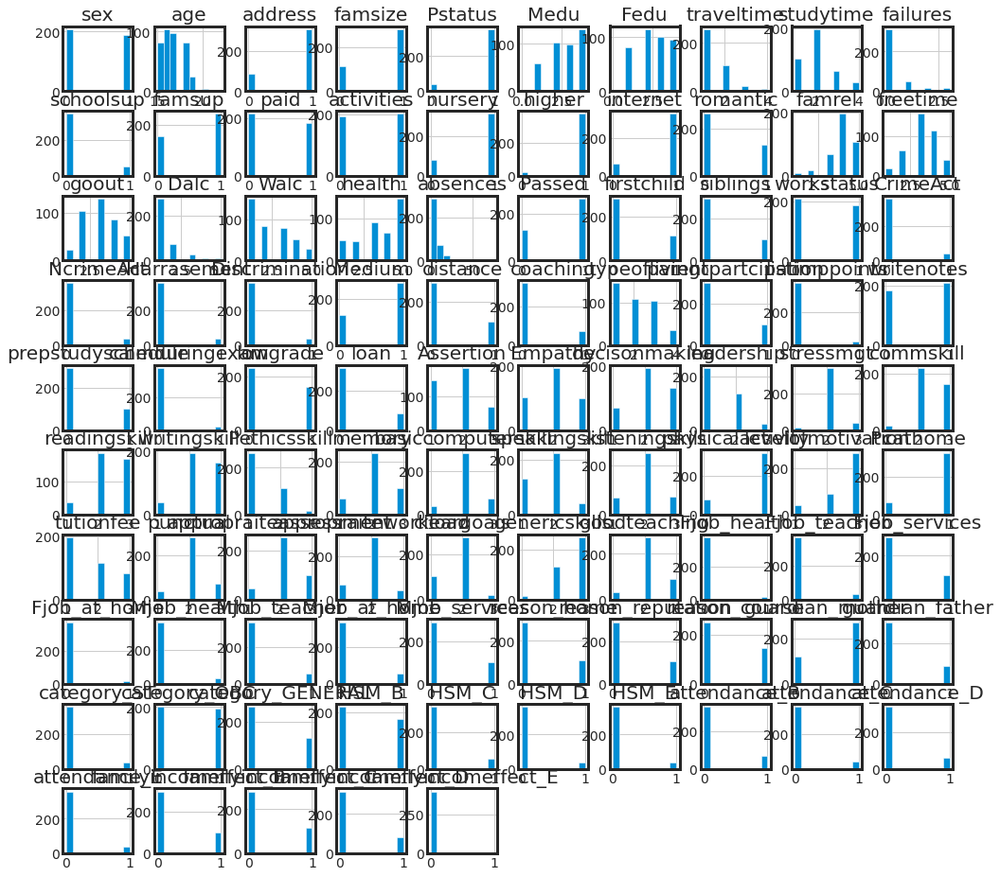

In [ ]:
fig, ax = plt.subplots(figsize=(15, 15))
X.hist(ax=ax)

plt.tight_layout()
plt.plot()

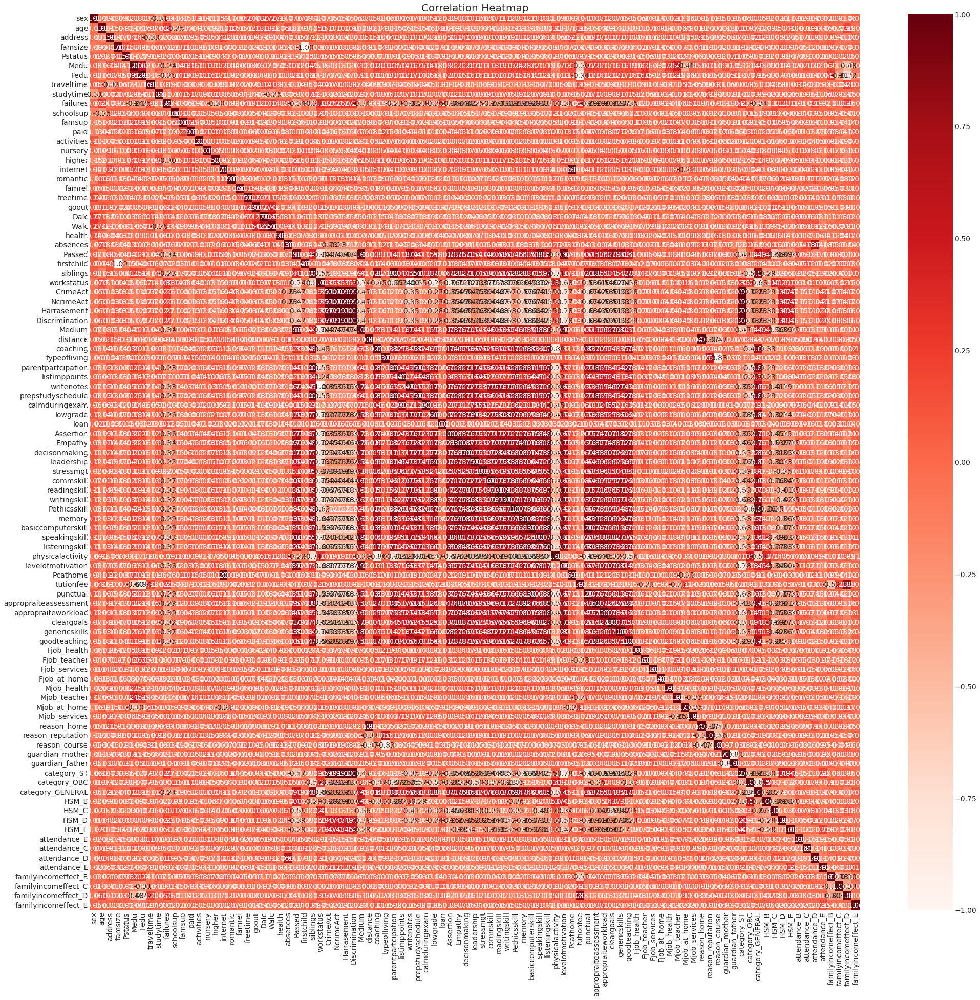

In [ ]:
fig, ax = plt.subplots(figsize=(30, 30))

ax = sns.heatmap(X.corr(), annot=True, fmt=".2f", cmap="Reds", ax=ax)
plt.title('Correlation Heatmap', fontsize=20)
plt.show()


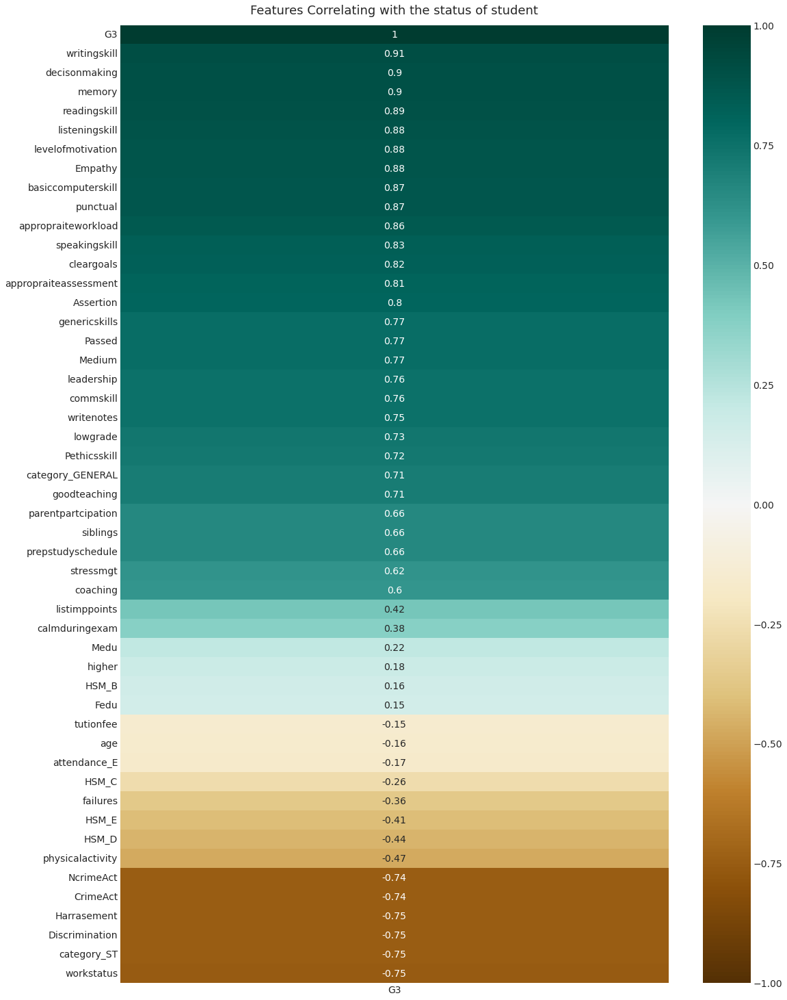

In [ ]:
plt.figure(figsize=(16, 24))
heatmap = sns.heatmap(student.corr()[['G3']].sort_values(by='G3', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with the status of student', fontdict={'fontsize':18}, pad=16);

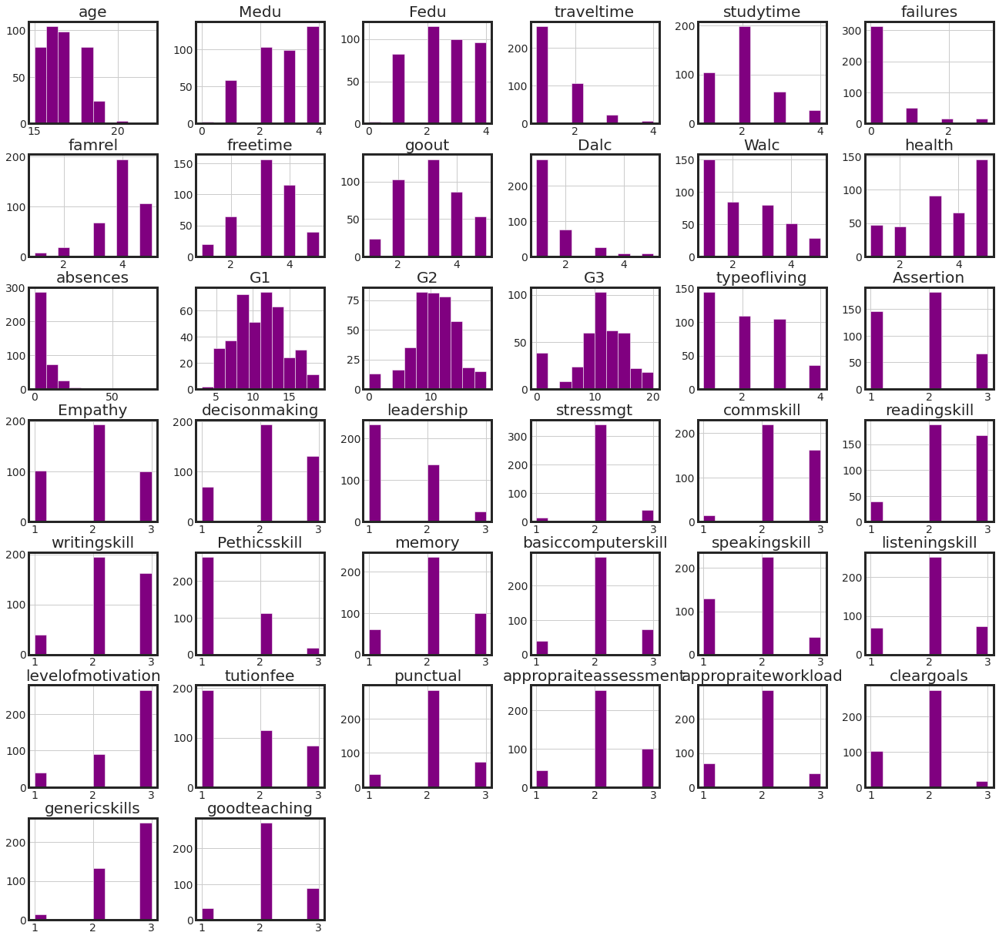

In [ ]:
df.hist(figsize = (20,20), color = 'purple')
plt.show()

In [ ]:
def cat_univariate_analysis(feature):
    
    data_ = df[feature].value_counts().sort_values(ascending=True)
    plt.figure(figsize=(20,5), facecolor='white')
    plt.subplot(1,2,1)
    plt.barh(y=data_.index, width=data_.values, 
             height=0.7, color=colors2, edgecolor='k',linewidth=1)
    sns.despine()
    
    ax = plt.subplot(1,2,2)
    ax.pie(x=data_.values, 
           labels=data_.index, 
           colors=colors2, 
           radius=1.2, 
           autopct="%1.1f%%", 
           shadow=True, 
           explode=[0.06 for i in range(df[feature].nunique())])
    ax.add_artist(plt.Circle((0,0), 0.4, fc='white'))
    plt.suptitle(t=feature, x=0.5, y=1.1, fontfamily='serif', fontsize=20, color='k', fontweight='bold',alpha=0.8)
    plt.show()

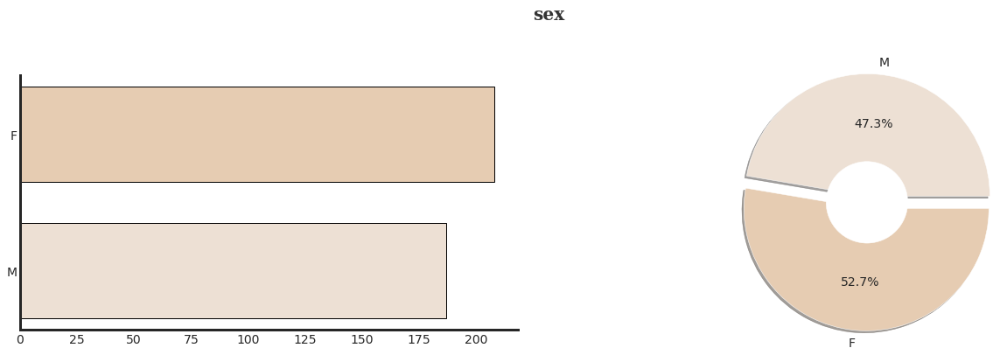

In [ ]:
cat_univariate_analysis('sex')

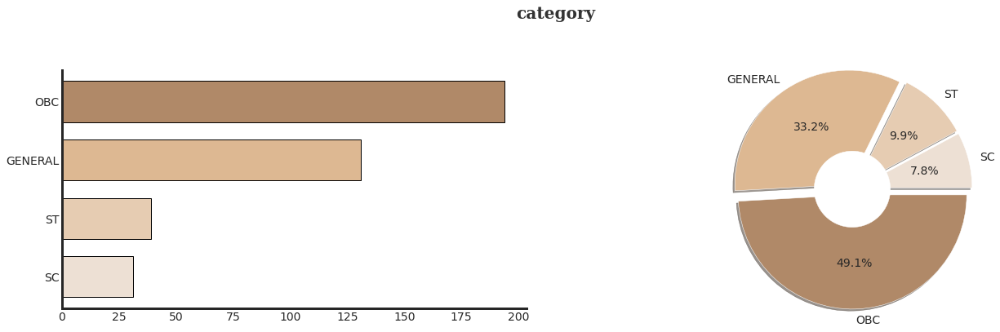

In [ ]:
cat_univariate_analysis('category')

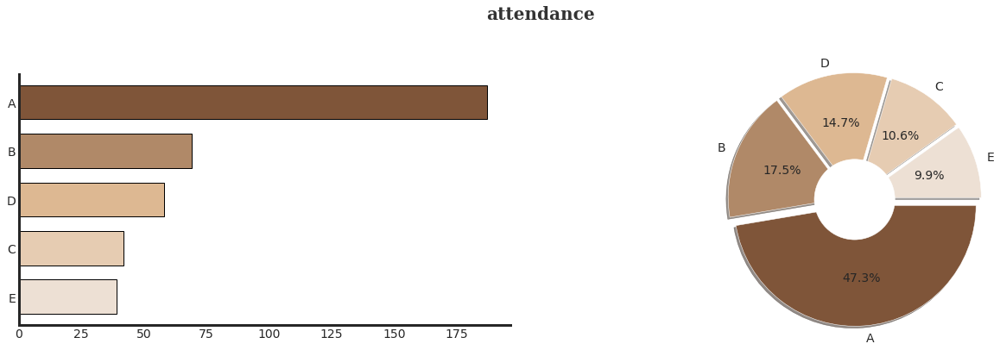

In [ ]:
cat_univariate_analysis('attendance')

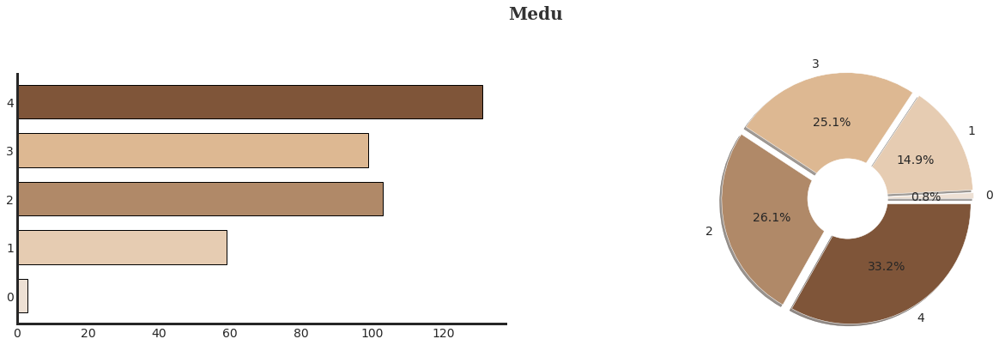

In [ ]:
cat_univariate_analysis('Medu')

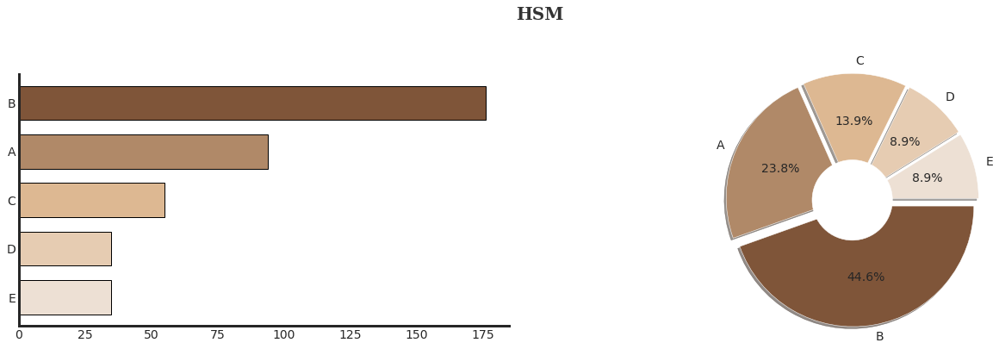

In [ ]:
cat_univariate_analysis('HSM')

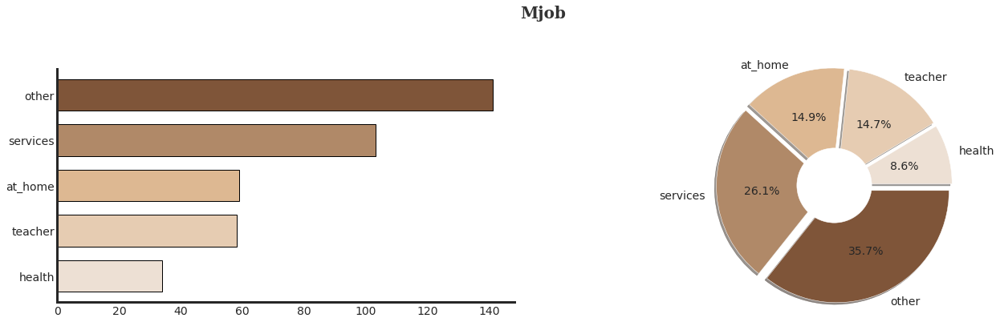

In [ ]:
cat_univariate_analysis('Mjob')

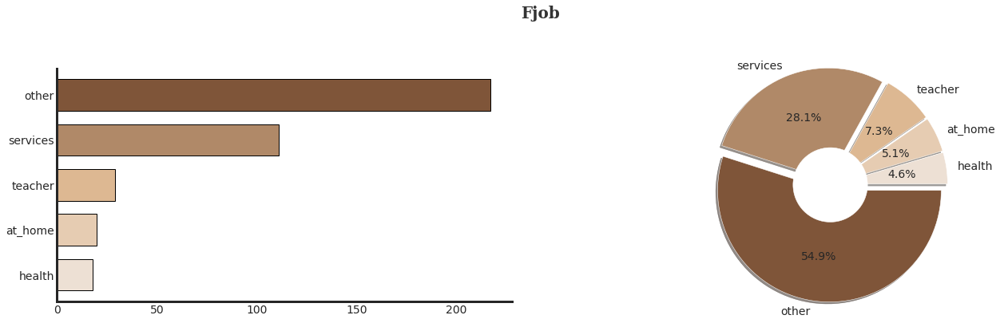

In [ ]:
cat_univariate_analysis('Fjob')

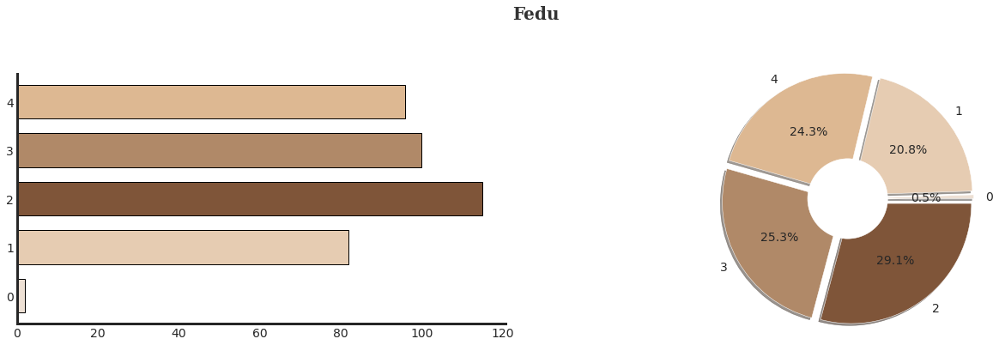

In [ ]:
cat_univariate_analysis('Fedu')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


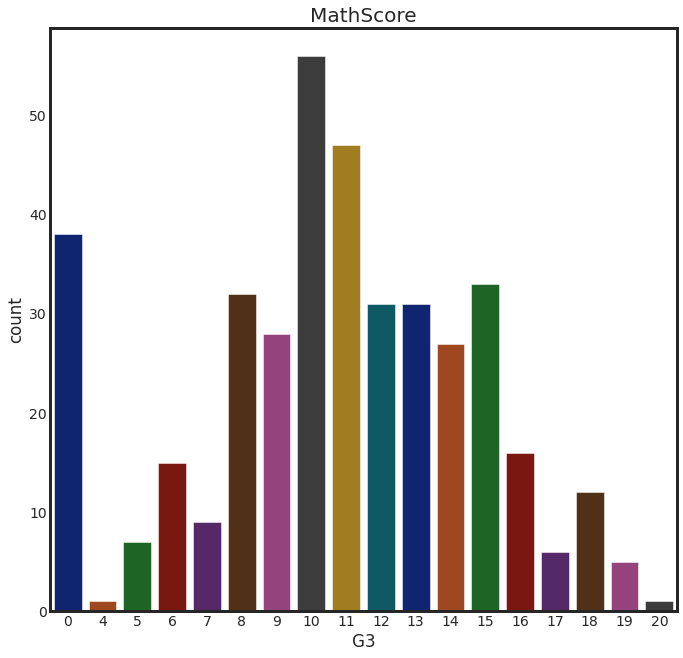

In [ ]:
plt.rcParams['figure.figsize'] = (10, 10)
sns.countplot(df['G3'], palette = 'dark')
plt.title('MathScore',fontsize = 20)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


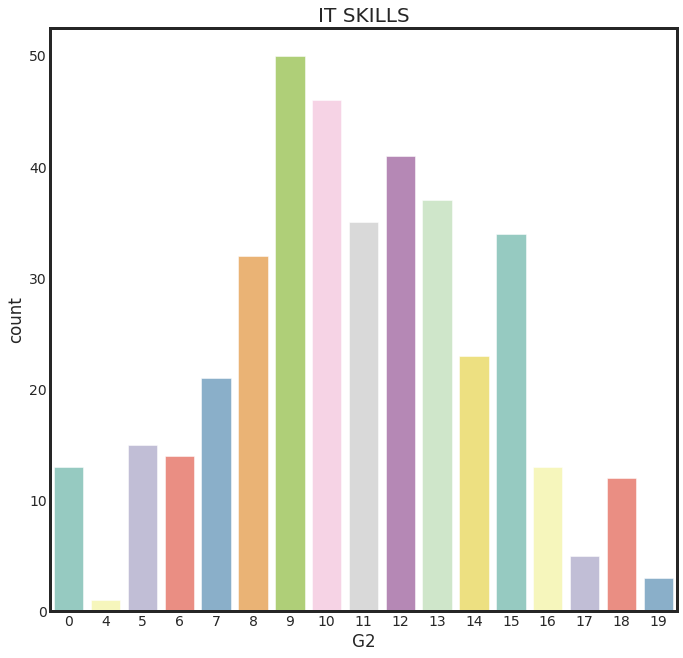

In [ ]:
plt.rcParams['figure.figsize'] = (10, 10)
sns.countplot(df['G2'], palette = 'Set3')
plt.title('IT SKILLS',fontsize = 20)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


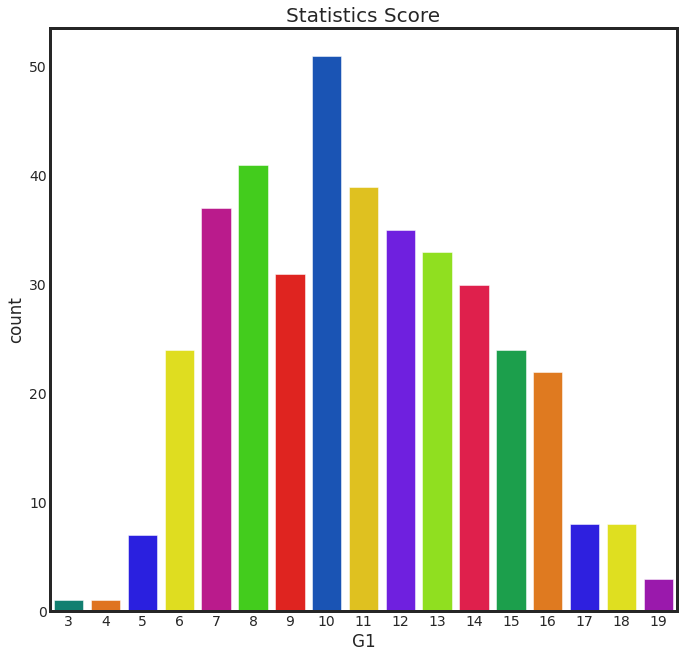

In [ ]:
plt.rcParams['figure.figsize'] = (10, 10)
sns.countplot(df['G1'], palette = 'prism')
plt.title('Statistics Score',fontsize = 20)
plt.show()

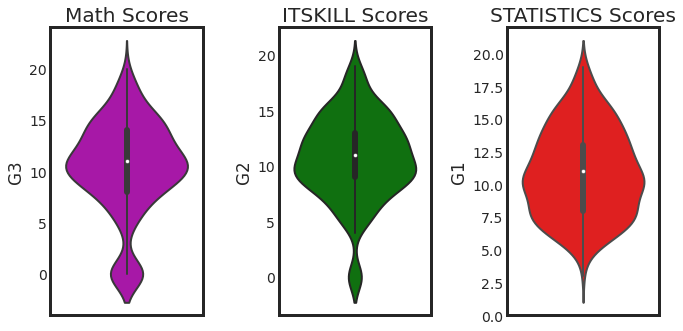

In [ ]:
plt.figure(figsize=(15,5))
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9,
                      wspace=0.5, hspace=0.2)
plt.subplot(141)
plt.title('Math Scores')
sns.violinplot(y='G3',data=df,color='m',linewidth=2)
plt.subplot(142)
plt.title('ITSKILL Scores')
sns.violinplot(y='G2',data=df,color='g',linewidth=2)
plt.subplot(143)
plt.title('STATISTICS Scores')
sns.violinplot(y='G1',data=df,color='r',linewidth=2)
plt.show()

In [ ]:
data.columns


Index(['sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'traveltime', 'studytime', 'failures', 'schoolsup', 'famsup', 'paid',
       'activities', 'nursery', 'higher', 'internet', 'romantic', 'famrel',
       'freetime', 'goout', 'Dalc', 'Walc', 'health', 'absences', 'G1', 'G2',
       'G3', 'Passed', 'firstchild', 'siblings', 'workstatus', 'CrimeAct',
       'NcrimeAct', 'Harrasement', 'Discrimination', 'Medium', 'distance',
       'coaching', 'typeofliving', 'parentpartcipation', 'listimppoints',
       'writenotes', 'prepstudyschedule', 'calmduringexam', 'lowgrade', 'loan',
       'Assertion', 'Empathy', 'decisonmaking', 'leadership', 'stressmgt',
       'commskill', 'readingskill', 'writingskill', 'Pethicsskill', 'memory',
       'basiccomputerskill', 'speakingskill', 'listeningskill',
       'physicalactivity', 'levelofmotivation', 'Pcathome', 'tutionfee',
       'punctual', 'appropraiteassessment', 'appropraiteworkload',
       'cleargoals', 'genericskills', 

In [ ]:
# Colors:
colors1 = ['#e6ccb2','#b08968','#7f5539'] 
colors2 = ['#ede0d4','#e6ccb2','#ddb892','#b08968','#7f5539','#9c6644','#dda15e']

Text(0.5, 1.0, 'Correlation Heatmap')

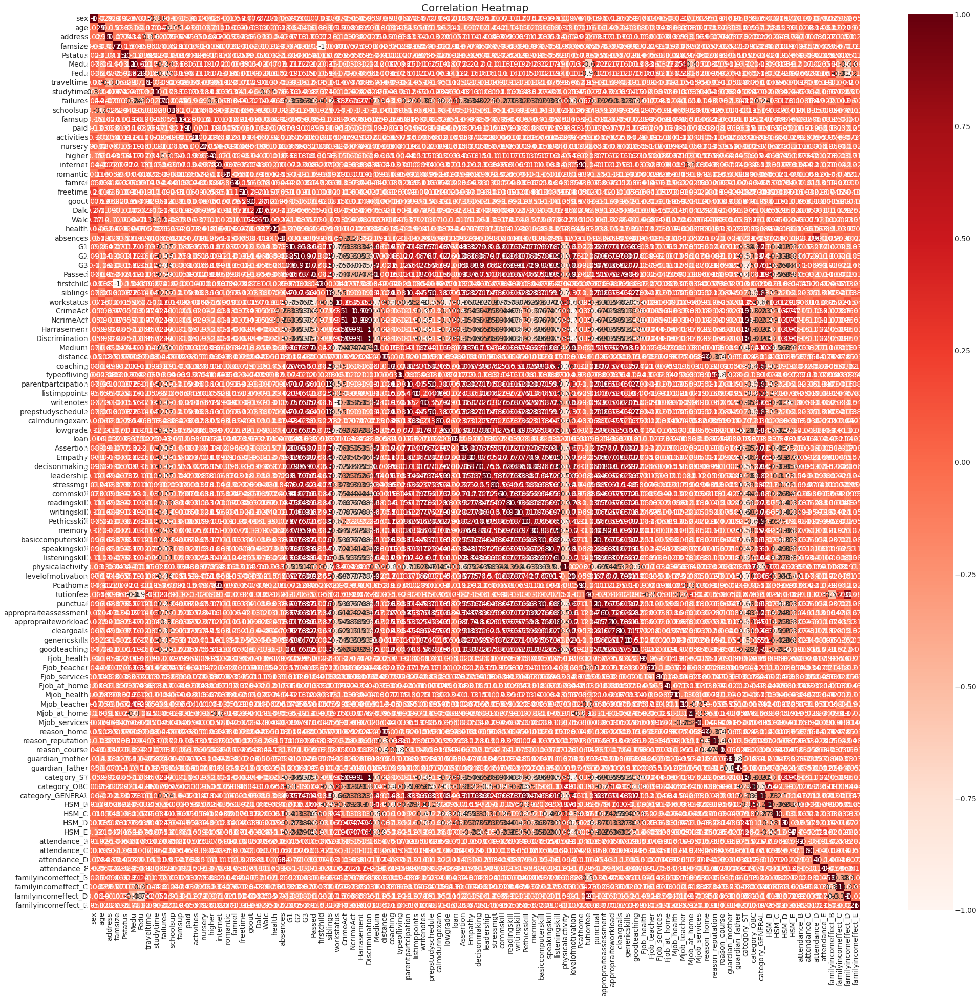

In [ ]:
# see correlation between variables through a correlation heatmap
corr = data.corr()
plt.figure(figsize=(30,30))
sns.heatmap(corr, annot=True, cmap="Reds")
plt.title('Correlation Heatmap', fontsize=20)

In [ ]:
#plot of student status
data['Passed'].value_counts()

1    265
0    130
Name: Passed, dtype: int64

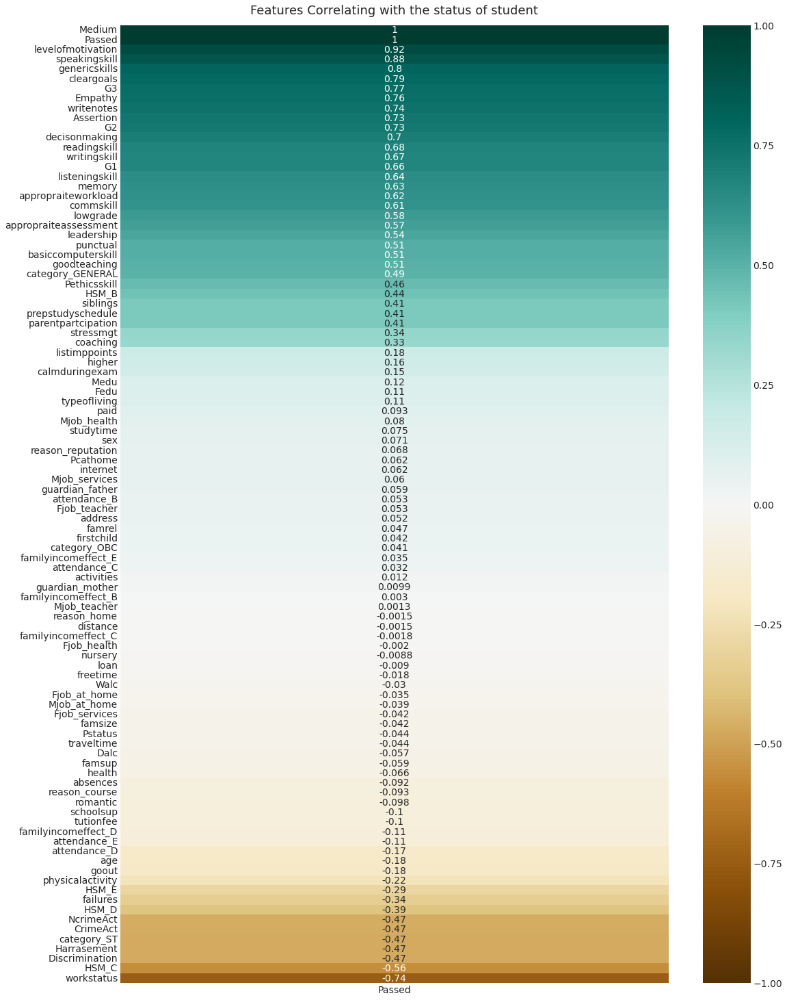

In [ ]:
plt.figure(figsize=(16, 24))
heatmap = sns.heatmap(data.corr()[['Passed']].sort_values(by='Passed', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Features Correlating with the status of student', fontdict={'fontsize':18}, pad=16);

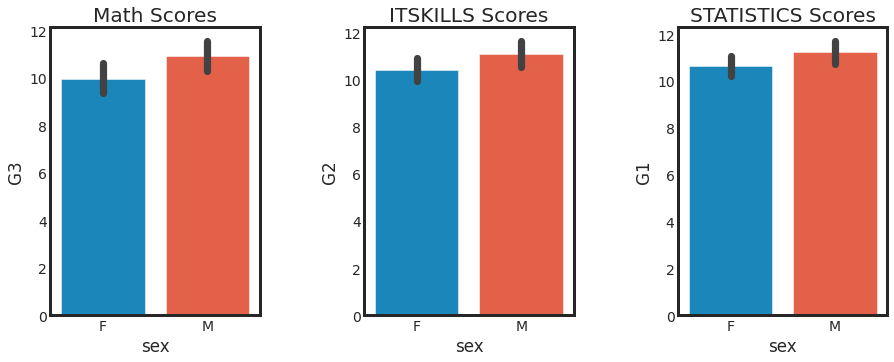

In [ ]:
plt.figure(figsize=(15,5))
plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.9,
                      wspace=0.5, hspace=0.2)
plt.subplot(131)
plt.title('Math Scores')
sns.barplot(x="sex", y="G3", data=df)
plt.subplot(132)
plt.title('ITSKILLS Scores')
sns.barplot(x="sex", y="G2", data=df)
plt.subplot(133)
plt.title('STATISTICS Scores')
sns.barplot(x="sex", y="G1", data=df)
plt.show()


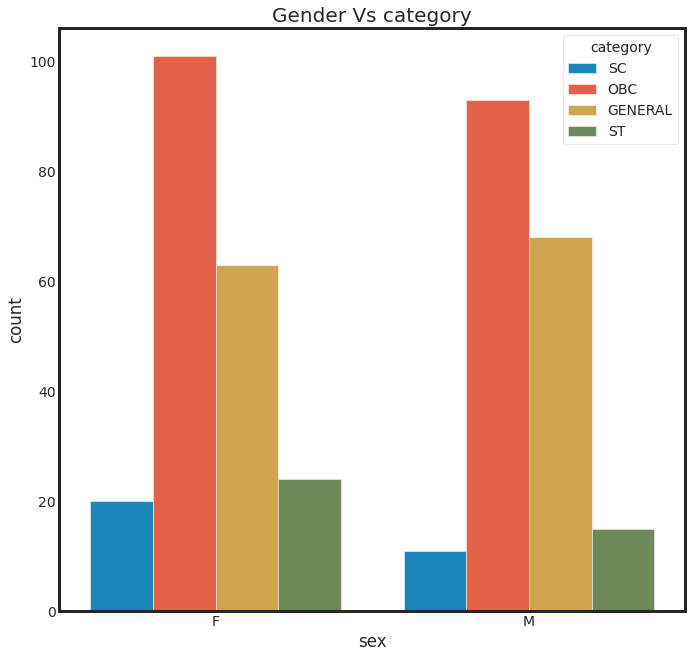

In [ ]:
plt.title('Gender Vs category',fontsize = 20)
sns.countplot(x="sex", hue="category", data=df)
plt.show()

In [ ]:
def scatter_with_hue(hue, palette):
    
    fig = plt.figure(figsize=(18,20))
    gs = fig.add_gridspec(3, 4)
    gs.update(wspace=0.5, hspace=0.3)

    ax0 = fig.add_subplot(gs[0,0:2])
    sns.scatterplot(data=data, x='G1', y='G3', hue=hue, s=100, palette=palette, alpha=0.7, ax=ax0)
    ax01 = fig.add_subplot(gs[0,2:4])
    sns.scatterplot(data=data, x='G2', y='G3', hue=hue, s=100, palette=palette, alpha=0.7, ax=ax01)
    plt.ylabel(ylabel=None)
    ax1 = fig.add_subplot(gs[1,0:2])
    sns.scatterplot(data=data, x='G1', y='G2', hue=hue, s=100, palette=palette, alpha=0.7, ax=ax1)
    ax11 = fig.add_subplot(gs[1,2:4])
    sns.scatterplot(data=data, x='G3', y='G2', hue=hue, s=100, palette=palette, alpha=0.7, ax=ax11)
    plt.ylabel(ylabel=None)

    ax2 = fig.add_subplot(gs[2,0:2])
    sns.scatterplot(data=data, x='G3', y='G2', hue=hue, s=100, palette=palette, alpha=0.7, ax=ax2)
    ax21 = fig.add_subplot(gs[2,2:4])
    sns.scatterplot(data=data, x='G2', y='G1', hue=hue, s=100, palette=palette, alpha=0.7, ax=ax21)
    plt.ylabel(ylabel=None)

    sns.despine()
    plt.show()

In [ ]:
def kde_with_hue(hue, palette, text1, text2, text3):
    
    fig = plt.figure(figsize=(20,18))
    gs = fig.add_gridspec(3, 4)
    gs.update(wspace=0.5, hspace=0.3)

    ax0 = fig.add_subplot(gs[0,0:2])
    sns.kdeplot(data=data, x='G3', hue=hue, shade=True, palette=palette, ax=ax0, alpha=0.5, edgecolor='k')
    ax01 = fig.add_subplot(gs[0,2])
    sns.stripplot(x=hue, y='G3', data=data, palette=palette, ax=ax01)
    if data[hue].nunique() < 3 :
        plt.xticks(fontsize=12)
    else: 
        ax01.set_xticks([])
    plt.text(s=text1, x=data[hue].nunique()+0.5, y=35, fontfamily='serif', fontsize=14, color='k', alpha=0.8, linespacing=1.8)

    ax1 = fig.add_subplot(gs[1,0:2])
    sns.kdeplot(data=data, x='G1', hue=hue, shade=True, palette=palette, ax=ax1, alpha=0.5, edgecolor='k')
    ax11 = fig.add_subplot(gs[1,2])
    sns.stripplot(x=hue, y='G1', data=data ,palette=palette, ax=ax11)
    if data[hue].nunique() < 3 :
        plt.xticks(fontsize=12)
    else: 
        ax11.set_xticks([])
    plt.text(s=text2, x=data[hue].nunique()+0.5, y=35, fontfamily='serif', fontsize=14, color='k', alpha=0.8, linespacing=1.8)

    ax2 = fig.add_subplot(gs[2,0:2])
    sns.kdeplot(data=data, x='G2', hue=hue, shade=True, palette=palette, ax=ax2, alpha=0.5, edgecolor='k')
    ax21 = fig.add_subplot(gs[2,2])
    sns.stripplot(x=hue, y='G2', data=data,palette=palette, ax=ax21)
    if data[hue].nunique() < 3 :
        plt.xticks(fontsize=12)
    else: 
        ax21.set_xticks([])
    plt.text(s=text3, x=data[hue].nunique()+0.5, y=35, fontfamily='serif', fontsize=14, color='k', alpha=0.8, linespacing=1.8)
    
    sns.despine()
    plt.show()

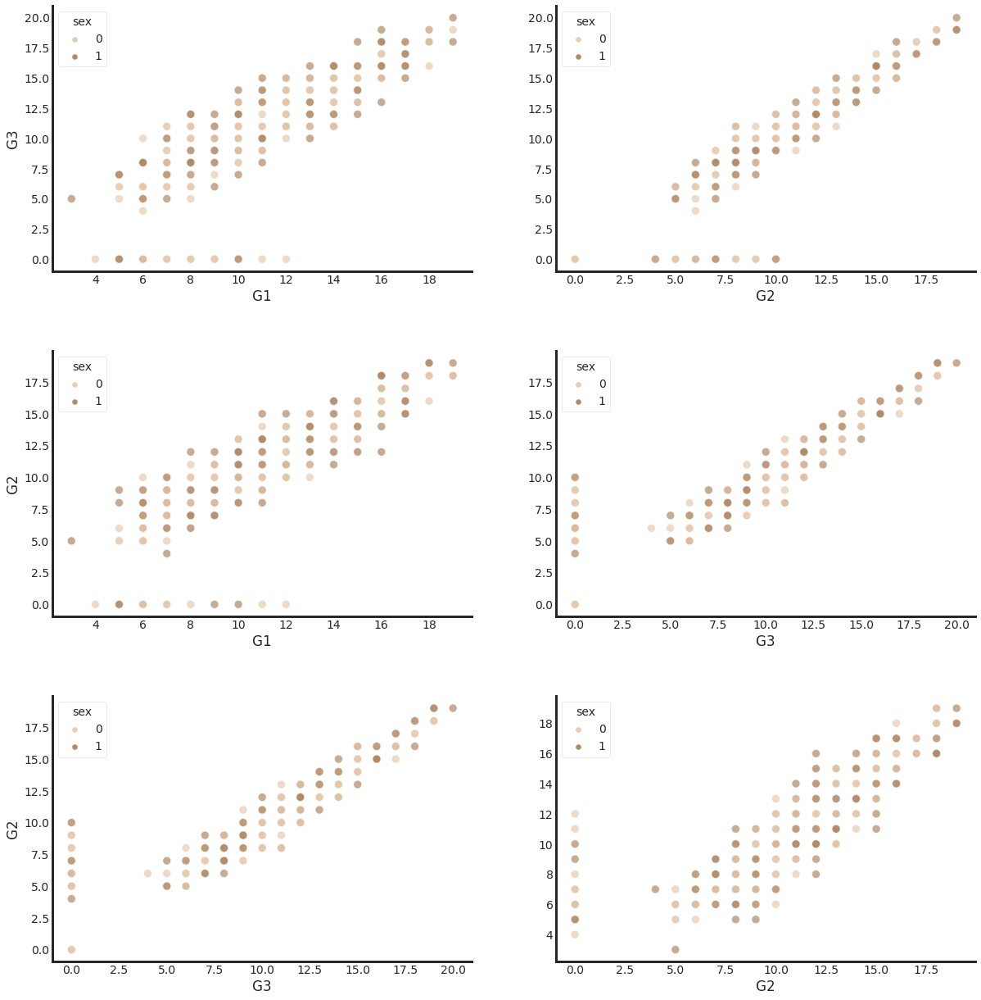

In [ ]:

palette1 = sns.set_palette(sns.color_palette(colors1))
scatter_with_hue('sex', palette1)

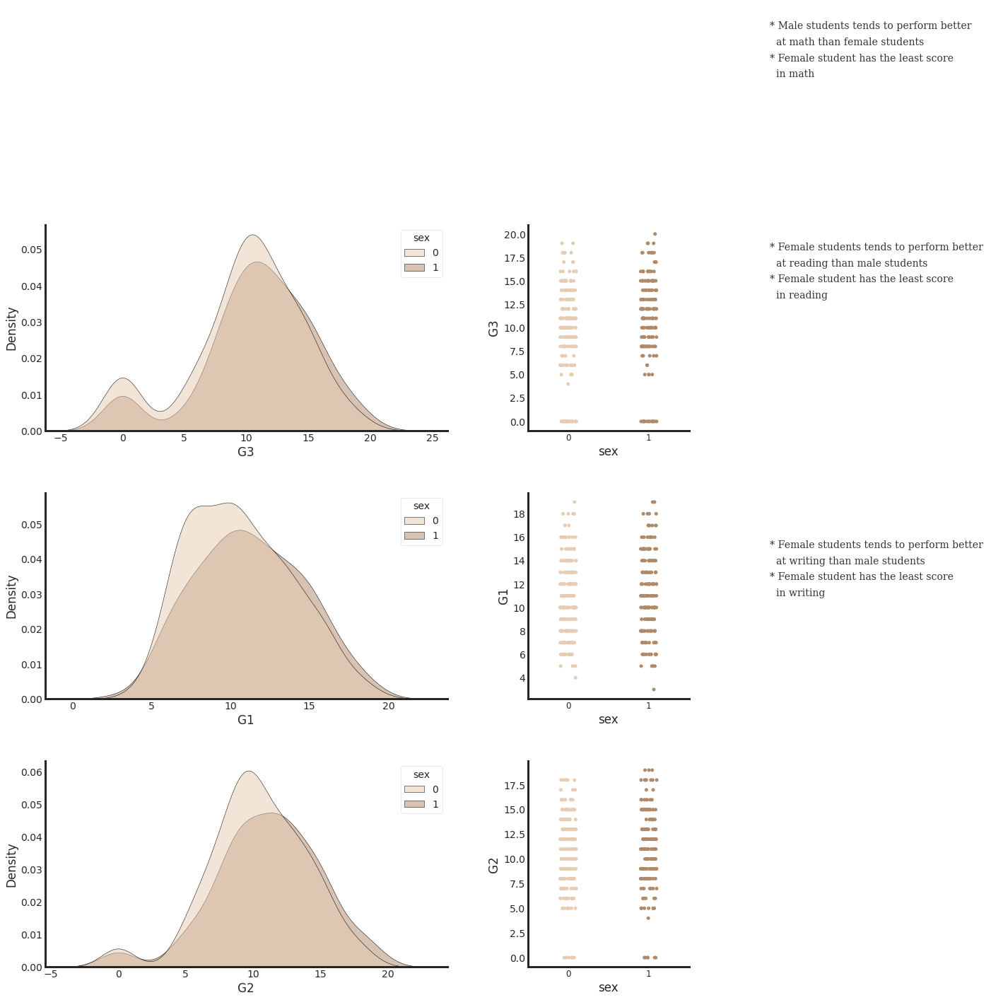

In [ ]:
text1='''
* Male students tends to perform better 
  at math than female students
* Female student has the least score 
  in math
'''
text2='''
* Female students tends to perform better 
  at reading than male students
* Female student has the least score 
  in reading
'''
text3='''
* Female students tends to perform better 
  at writing than male students
* Female student has the least score 
  in writing
'''


palette1 = sns.set_palette(sns.color_palette(colors1))
kde_with_hue('sex', palette1, text1, text2, text3)

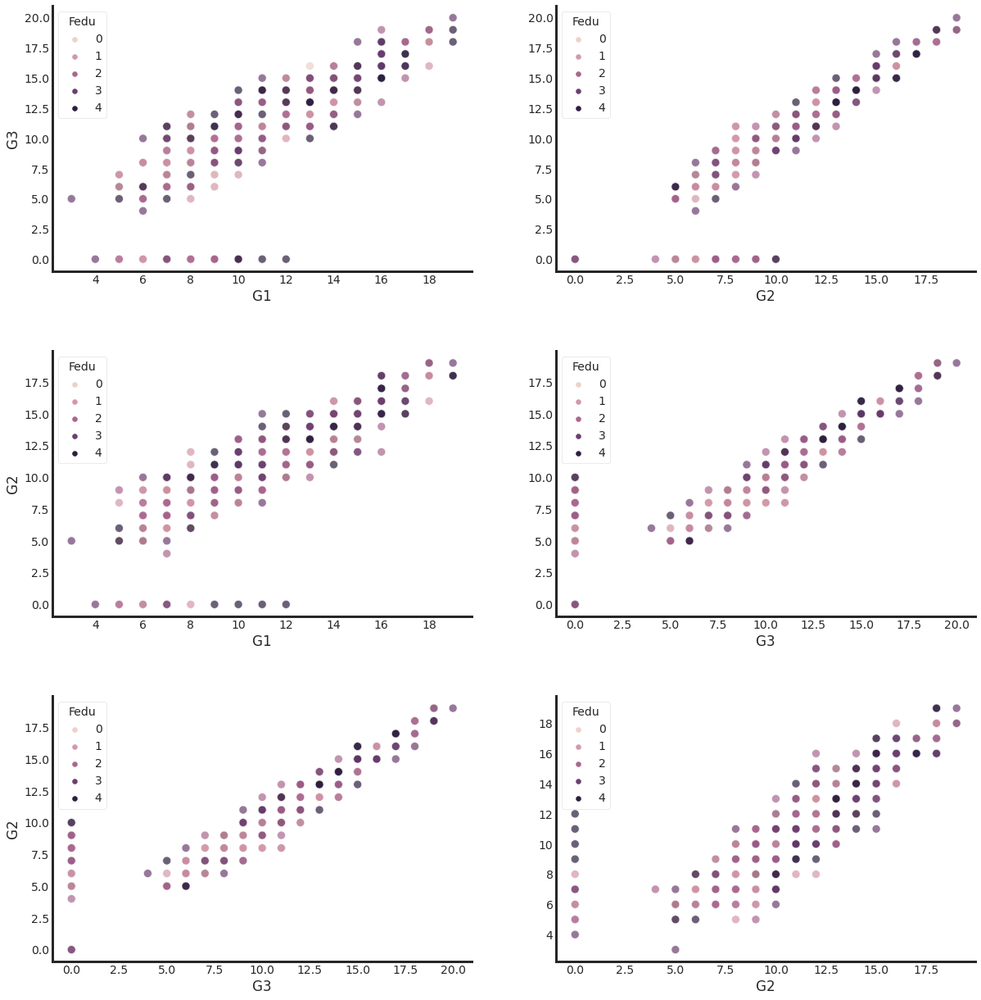

In [ ]:
palette1 = sns.set_palette(sns.color_palette(colors1))
scatter_with_hue('Fedu', palette1)

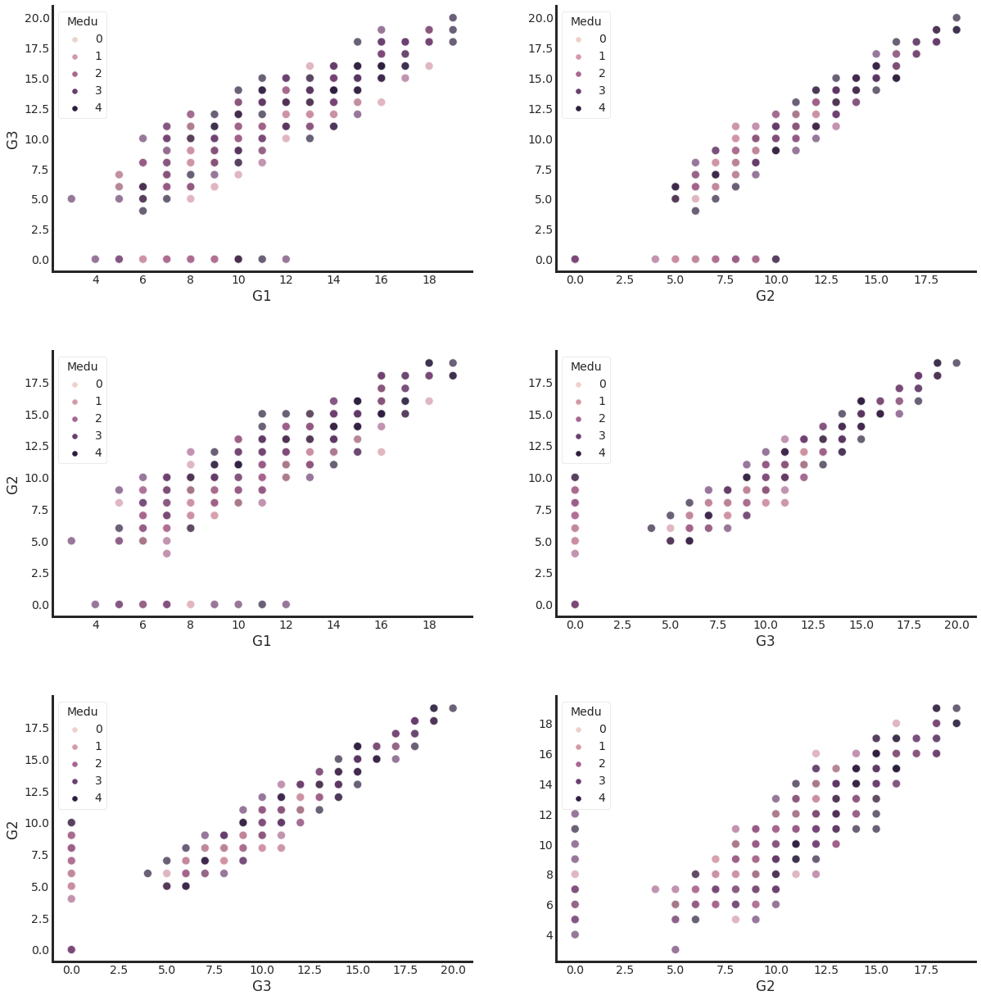

In [ ]:
palette1 = sns.set_palette(sns.color_palette(colors1))
scatter_with_hue('Medu', palette1)

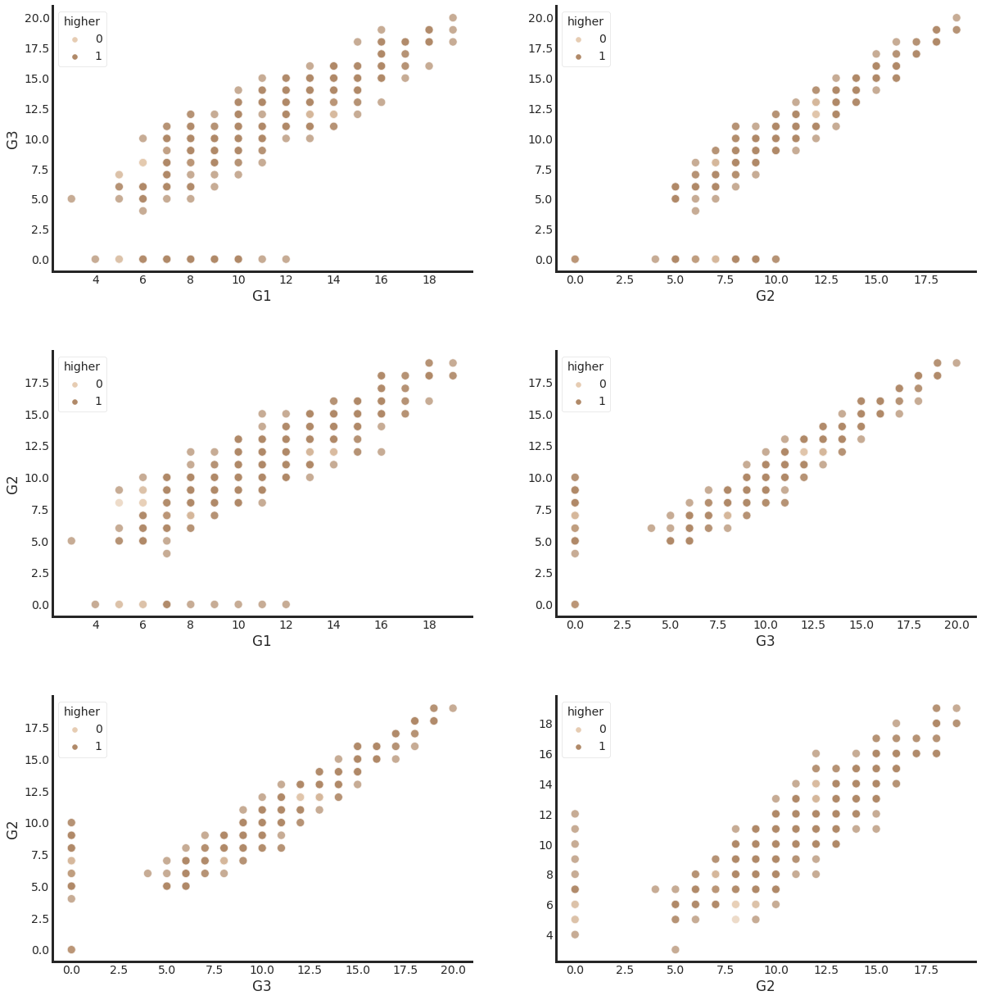

In [ ]:
palette1 = sns.set_palette(sns.color_palette(colors1))
scatter_with_hue('higher', palette1)

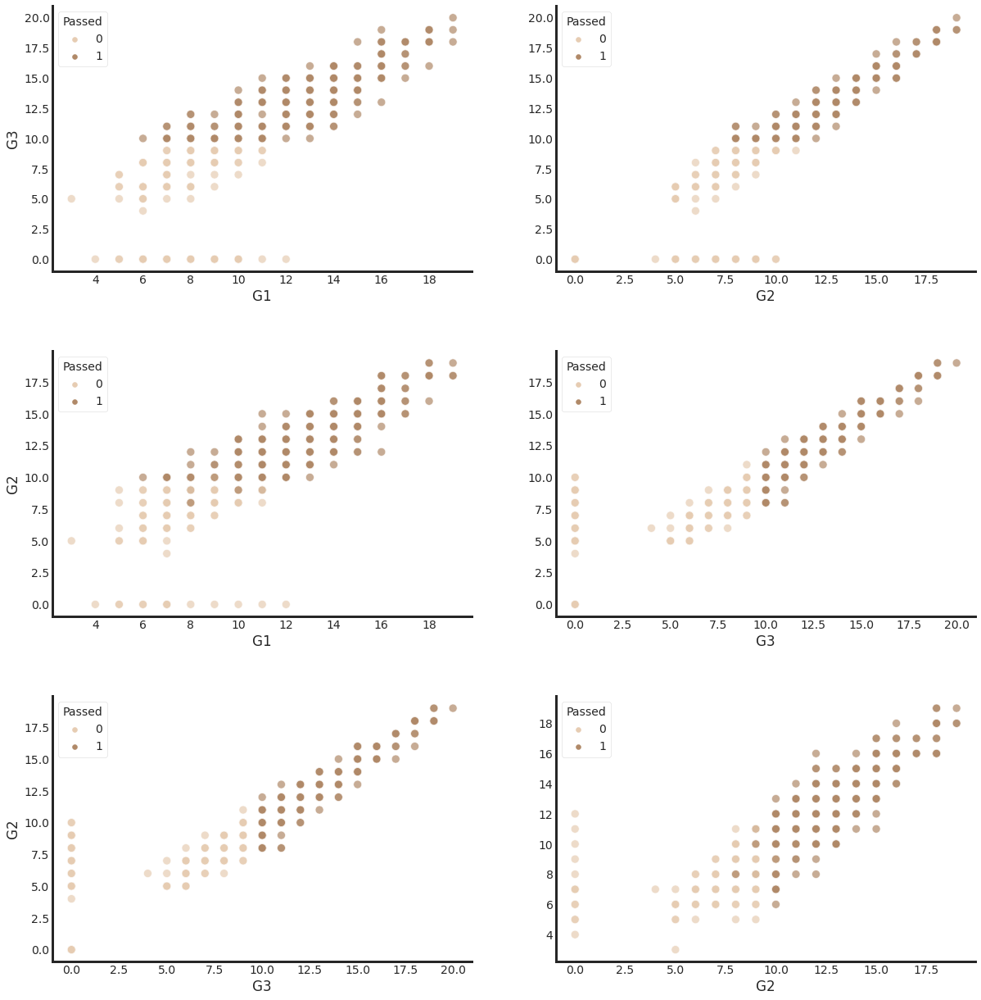

In [ ]:
palette1 = sns.set_palette(sns.color_palette(colors1))
scatter_with_hue('Passed', palette1)

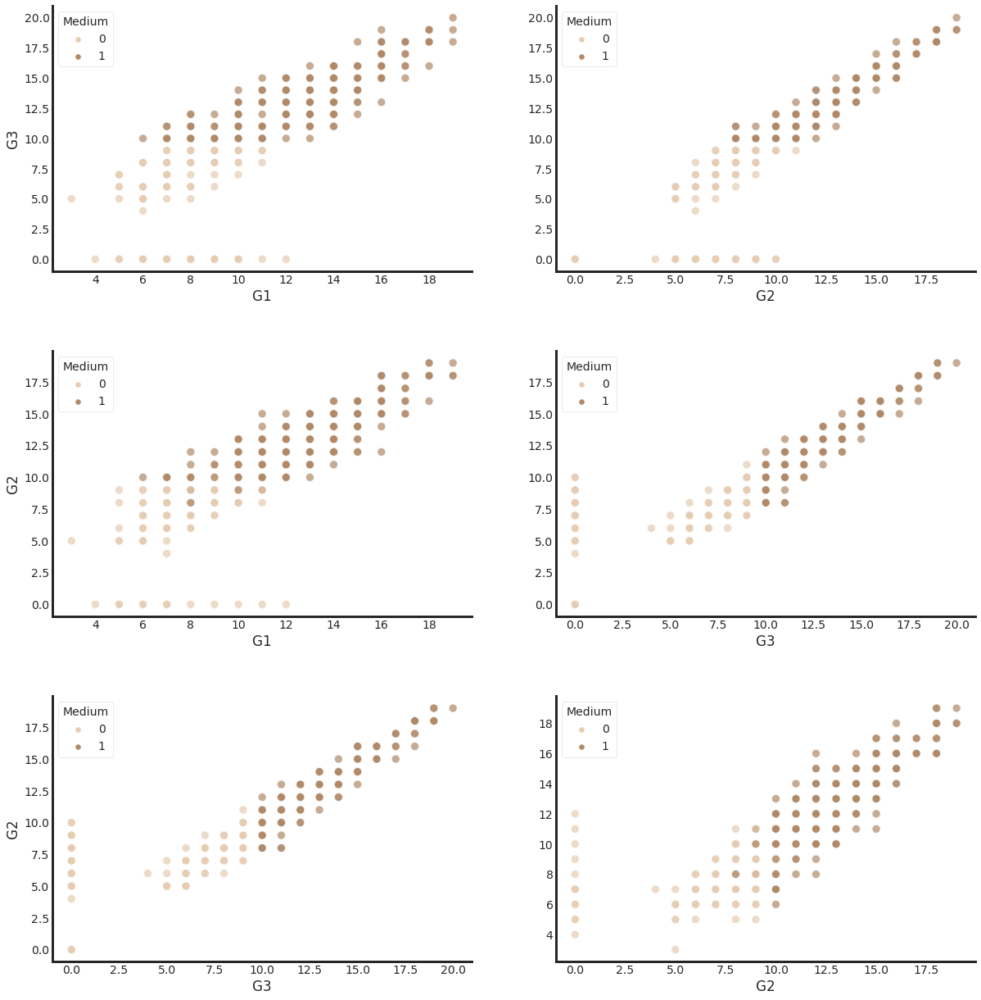

In [ ]:
palette1 = sns.set_palette(sns.color_palette(colors1))
scatter_with_hue('Medium', palette1)
